## Preliminaries

In [24]:
import numpy as np
import torch
import matplotlib
import matplotlib.pyplot as plt

import torchvision
from torchvision import transforms

In [25]:
data_path = "/home/sravula/experiments/datasets/8047_vel_imgs.npy"

In [26]:
from datasets.velocity_fine import Velocity

tran_transform = transforms.Compose([
    transforms.Resize([256, 256])
])

dataset = Velocity(path=data_path, transform=tran_transform)

In [27]:
N = len(dataset)
indices = list(range(N))
random_state = np.random.get_state()
np.random.seed(2240)
np.random.shuffle(indices)
np.random.set_state(random_state)
train_indices, test_indices = indices[:int(N * 0.9)], indices[int(N * 0.9):]

In [28]:
test_dataset = torch.utils.data.Subset(dataset, test_indices)

In [29]:
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=15, shuffle=False,
                         num_workers=8, drop_last=True)

test_iter = iter(test_loader)

test_sample = next(test_iter)[0]

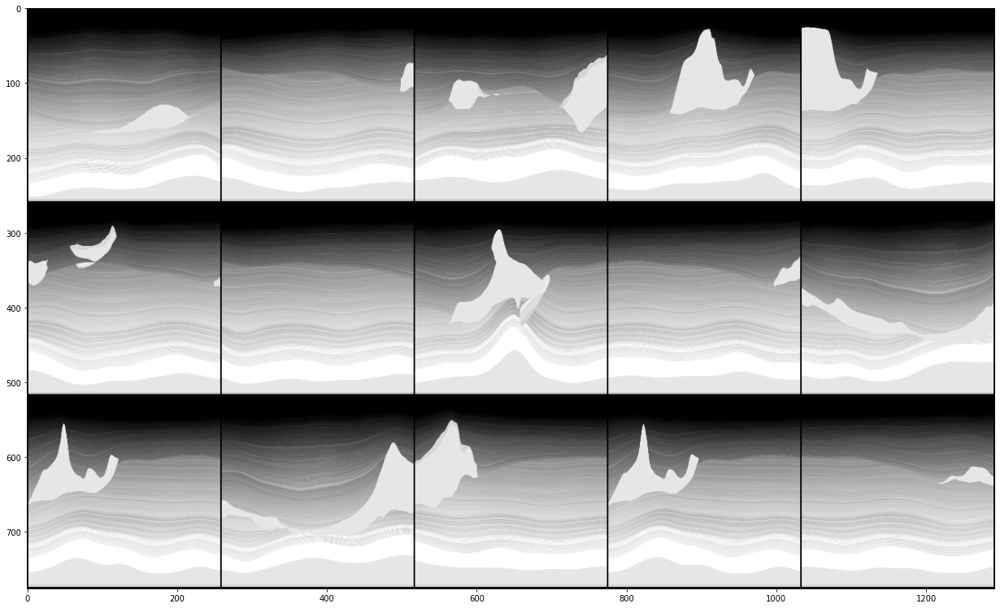

In [30]:
grid_img = torchvision.utils.make_grid(test_sample, nrow=5)

dpi = matplotlib.rcParams['figure.dpi']

height = width = 6*256
figsize = width / float(dpi), height / float(dpi)

plt.figure(figsize=figsize)
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

## Create Measurements

In [31]:
#We want y = Ax where A is a random Gaussian
#y = [N, m, 1], A = [N, m, C x W x H], x = [N, C, H, W]

N, C, H, W = test_sample.shape

m = 30000

In [32]:
#A = (1 / np.sqrt(m)) * torch.randn(m, C*H*W)
A = torch.eye(C*H*W)[np.random.choice(a=C*H*W, size=m, replace=False).tolist()]

y = torch.matmul(A, test_sample.view(N, -1, 1))

print(A.shape)
print(y.shape)
print(test_sample.shape)

torch.Size([10000, 65536])
torch.Size([15, 10000, 1])
torch.Size([15, 1, 256, 256])


## Load the network and see the outputs with test samples

In [33]:
ckpt_path = "/home/sravula/experiments/logs/run_2/checkpoint.pth"
config_path = "/home/sravula/ncsnv2/configs/velocity.yml"

In [34]:
import argparse
from main import dict2namespace
import yaml

with open(config_path, 'r') as f:
    config = yaml.load(f)
new_config = dict2namespace(config)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
new_config.device = device

print(device)

cuda


/home/sravula/venvs/ncsnv2/lib64/python3.6/site-packages/ipykernel_launcher.py:6: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  


In [35]:
from models.ncsnv2 import NCSNv2Deepest
from models.ema import EMAHelper
from models import get_sigmas

new_config.input_dim = new_config.data.image_size ** 2 * new_config.data.channels

score = NCSNv2Deepest(new_config).to(new_config.device)
score = torch.nn.DataParallel(score)

#Set up the exponential moving average
if new_config.model.ema:
    ema_helper = EMAHelper(mu=new_config.model.ema_rate)
    ema_helper.register(score)

states = torch.load(ckpt_path)
score.load_state_dict(states[0])
### Make sure we can resume with different eps
states[1]['param_groups'][0]['eps'] = new_config.optim.eps

if new_config.model.ema:
    ema_helper.load_state_dict(states[4])

#grab all L noise levels
sigmas = get_sigmas(new_config)

In [36]:
test_score = ema_helper.ema_copy(score)

test_score.eval();

In [37]:
with torch.no_grad():
    labels = torch.ones(test_sample.shape[0], device=test_sample.device) * 1099
    labels = labels.long()

    grad = test_score(test_sample, labels)
    
    prior_norm = torch.norm(grad.view(grad.shape[0], -1), dim=-1).mean()

print("Mean L2-Norm of s(x) = \grad_x log p(x) of test samples: ", prior_norm.item())

Mean L2-Norm of s(x) = \grad_x log p(x) of test samples:  10085.5751953125


## Set up and run Inverse Solver

In [38]:
from models import inverse_solver
import time

N, C, H, W = test_sample.shape
print(N, C, H, W)

y = y.to(new_config.device)

A = A.to(new_config.device)

x0 = torch.rand(N, C, H, W, device=new_config.device)

mse = torch.nn.MSELoss()
mse_start = mse(x0, test_sample.to(new_config.device))
print("Start MSE: ", mse_start.item())

start = time.time()

num_iters = 100

lr = [0.001, 0.0001]

15 1 256 256
Start MSE:  0.21278560161590576


In [39]:
all_samples = inverse_solver(x_mod = x0, 
                             y = y, 
                             A = A, 
                             scorenet = test_score, 
                             sigmas = sigmas.cpu().numpy(), 
                             lr = lr, 
                             c2=1,
                             auto_c2=True,
                             final_only=False, 
                             verbose=True, 
                             likelihood_every=1,
                             decimate_sigma=1100//num_iters,
                             mode=None, 
                             true_x=test_sample.to(new_config.device), 
                             sigma_type = 'last')

print("\nTOTAL TIME: ", time.time() - start)


 iteration: 0, sigma: 0.0100, step_size: 0.0010, prior_norm: 25540.8516, likelihood_norm: 25540.8535, grad_norm: 40817.3984                         image_norm: 139.7257, train_mse: 0.2135
true_mse: 0.1369

 iteration: 1, sigma: 0.0100, step_size: 0.0010, prior_norm: 25643.3457, likelihood_norm: 8461.9707, grad_norm: 24517.7832                         image_norm: 135.7348, train_mse: 0.0234
true_mse: 0.0999

 iteration: 2, sigma: 0.0100, step_size: 0.0010, prior_norm: 25807.0176, likelihood_norm: 8171.6138, grad_norm: 22673.6172                         image_norm: 135.1743, train_mse: 0.0219
true_mse: 0.0790

 iteration: 3, sigma: 0.0100, step_size: 0.0009, prior_norm: 24296.7012, likelihood_norm: 10933.6826, grad_norm: 16079.0518                         image_norm: 137.2426, train_mse: 0.0391
true_mse: 0.0673

 iteration: 4, sigma: 0.0100, step_size: 0.0009, prior_norm: 25301.7441, likelihood_norm: 15967.7178, grad_norm: 37062.4375                         image_norm: 143.1002, train_m


 iteration: 40, sigma: 0.0100, step_size: 0.0004, prior_norm: 23932.0527, likelihood_norm: 3807.0601, grad_norm: 26641.0195                         image_norm: 171.1580, train_mse: 0.0048
true_mse: 0.0033

 iteration: 41, sigma: 0.0100, step_size: 0.0004, prior_norm: 23952.4805, likelihood_norm: 3718.5940, grad_norm: 26580.4590                         image_norm: 171.3727, train_mse: 0.0045
true_mse: 0.0032

 iteration: 42, sigma: 0.0100, step_size: 0.0004, prior_norm: 23930.4316, likelihood_norm: 3644.1379, grad_norm: 26496.4277                         image_norm: 171.5901, train_mse: 0.0044
true_mse: 0.0031

 iteration: 43, sigma: 0.0100, step_size: 0.0004, prior_norm: 23947.5176, likelihood_norm: 3560.6780, grad_norm: 26433.2559                         image_norm: 171.7831, train_mse: 0.0042
true_mse: 0.0030

 iteration: 44, sigma: 0.0100, step_size: 0.0004, prior_norm: 23925.5078, likelihood_norm: 3494.5059, grad_norm: 26354.8340                         image_norm: 171.9785, train


 iteration: 80, sigma: 0.0100, step_size: 0.0002, prior_norm: 22871.1523, likelihood_norm: 2167.5415, grad_norm: 23703.3164                         image_norm: 175.1635, train_mse: 0.0016
true_mse: 0.0019

 iteration: 81, sigma: 0.0100, step_size: 0.0002, prior_norm: 22779.6309, likelihood_norm: 2147.6560, grad_norm: 23573.1602                         image_norm: 175.1996, train_mse: 0.0015
true_mse: 0.0019

 iteration: 82, sigma: 0.0100, step_size: 0.0001, prior_norm: 22657.5137, likelihood_norm: 2137.0386, grad_norm: 23432.5586                         image_norm: 175.2358, train_mse: 0.0015
true_mse: 0.0019

 iteration: 83, sigma: 0.0100, step_size: 0.0001, prior_norm: 22543.3711, likelihood_norm: 2118.5444, grad_norm: 23280.6113                         image_norm: 175.2693, train_mse: 0.0015
true_mse: 0.0019

 iteration: 84, sigma: 0.0100, step_size: 0.0001, prior_norm: 22396.7305, likelihood_norm: 2108.7285, grad_norm: 23115.6172                         image_norm: 175.3027, train

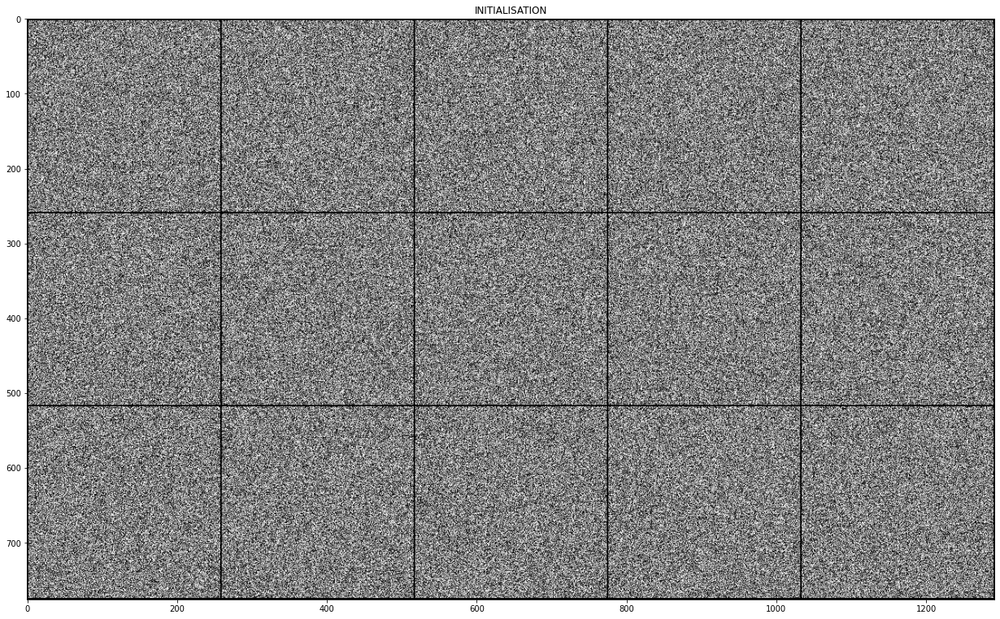

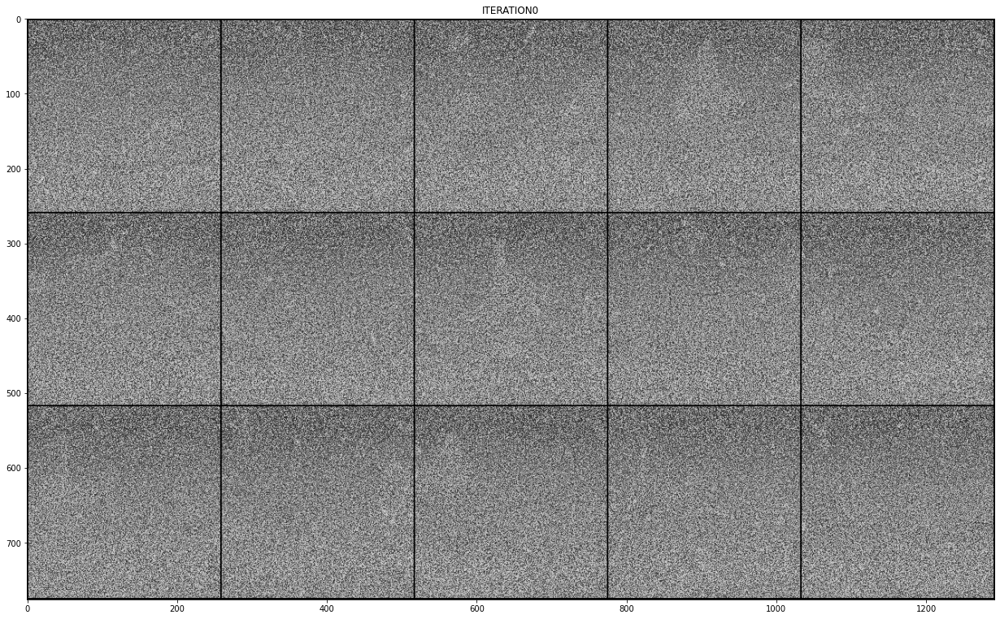

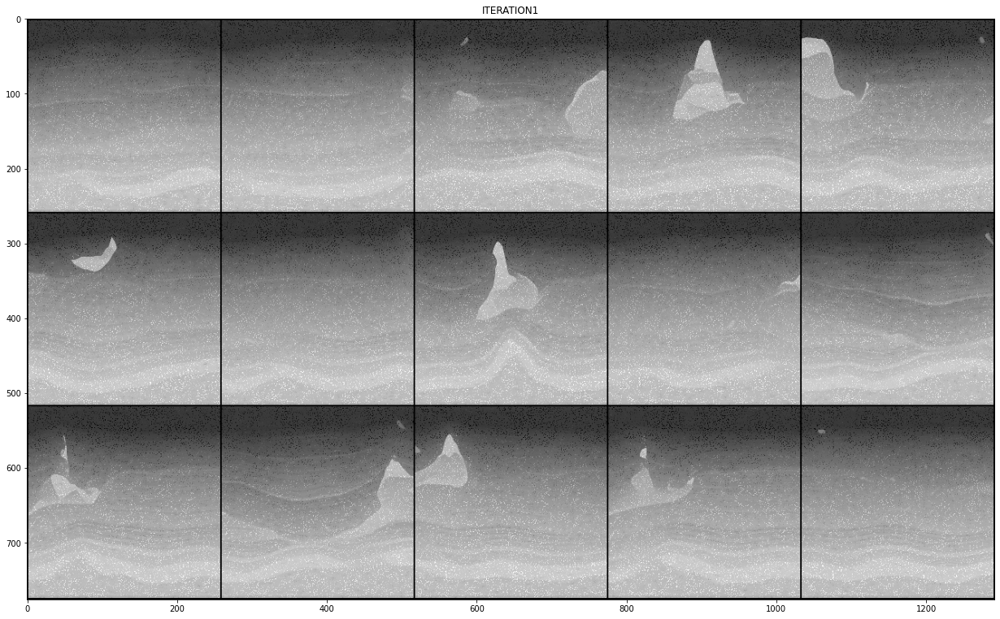

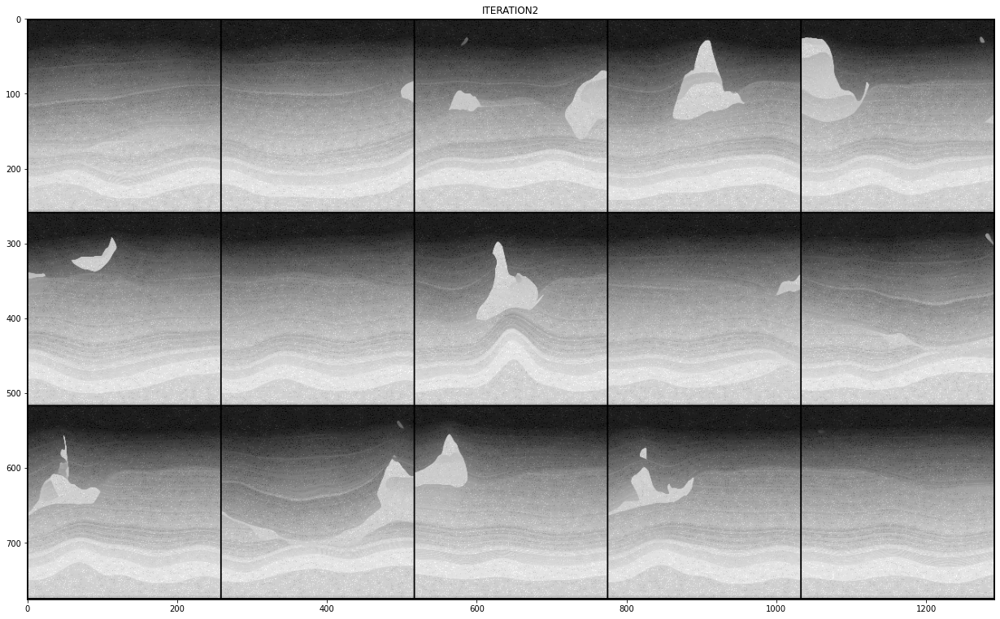

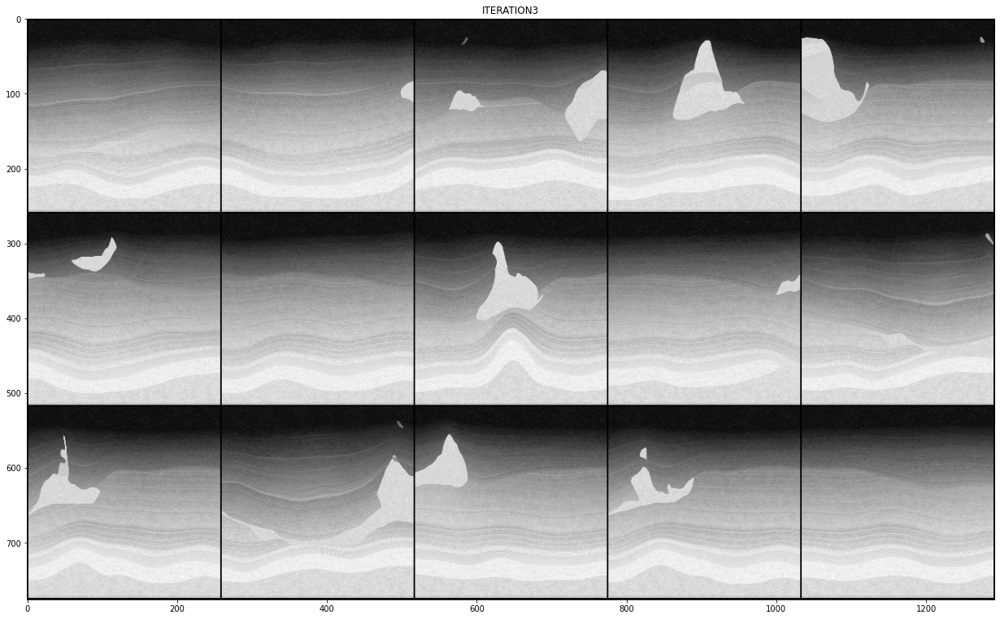

...

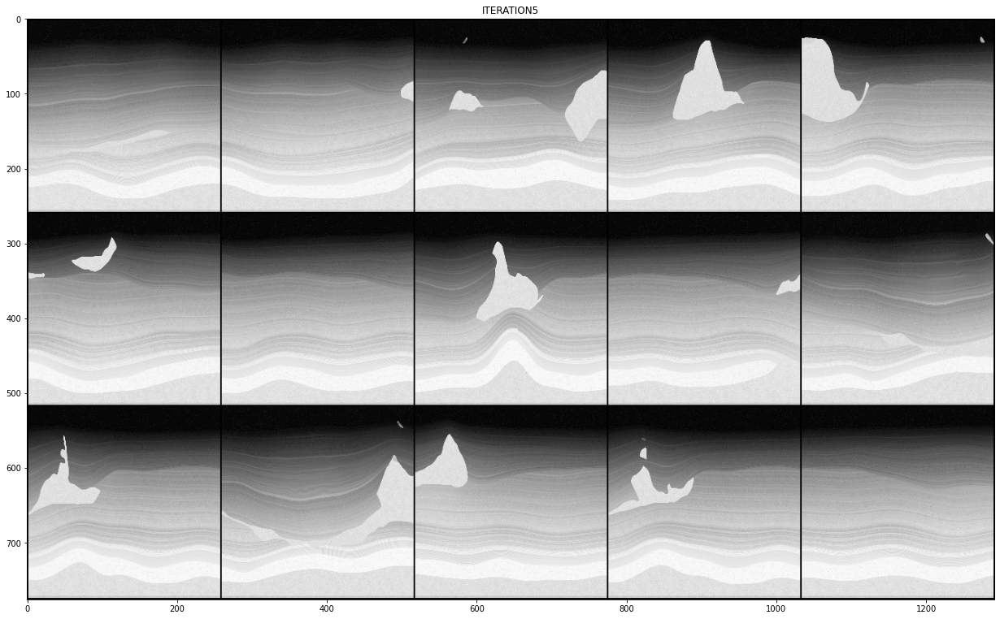

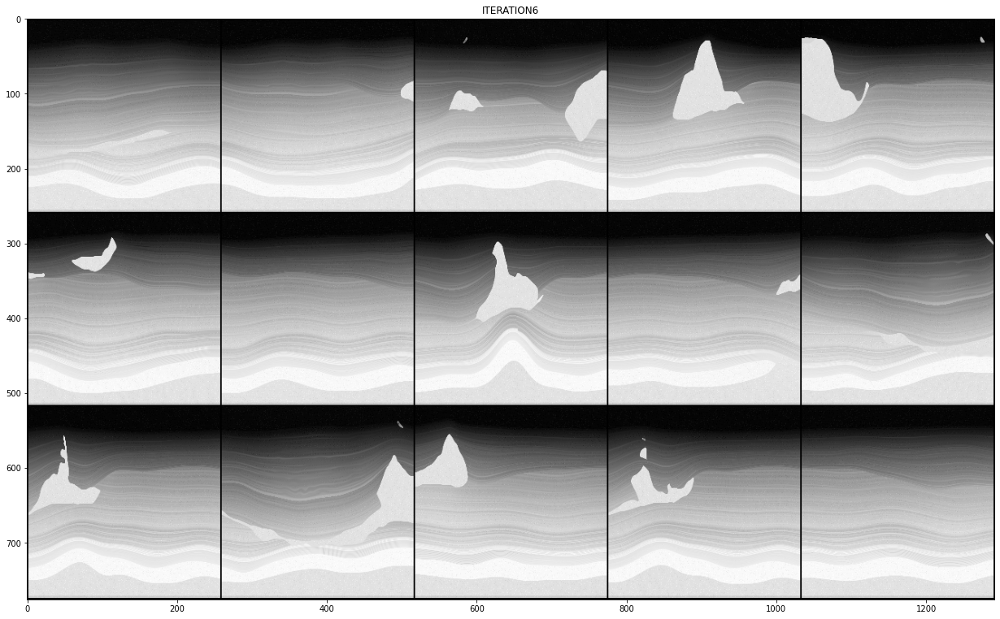

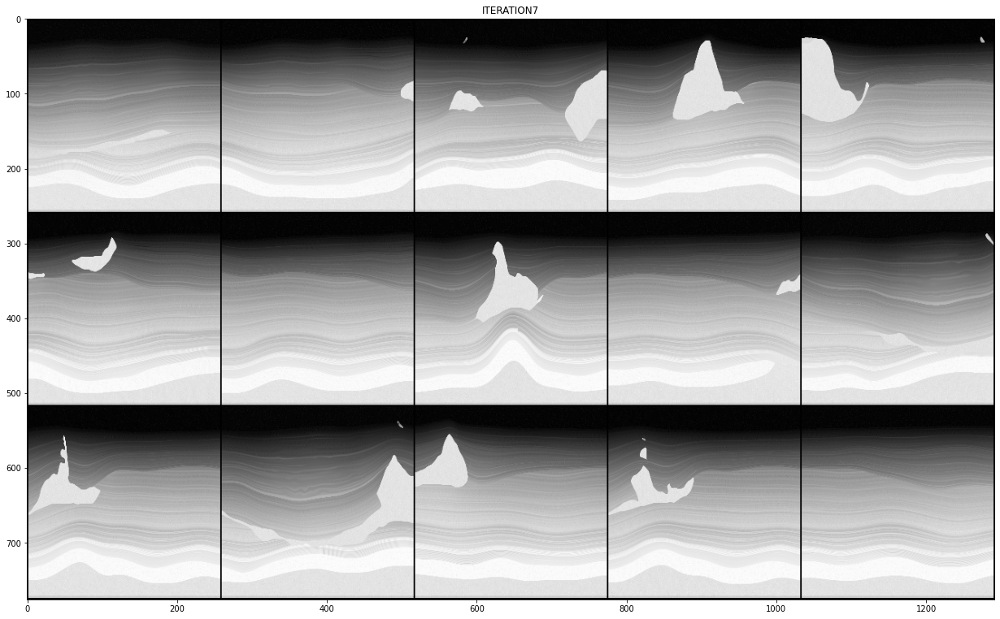

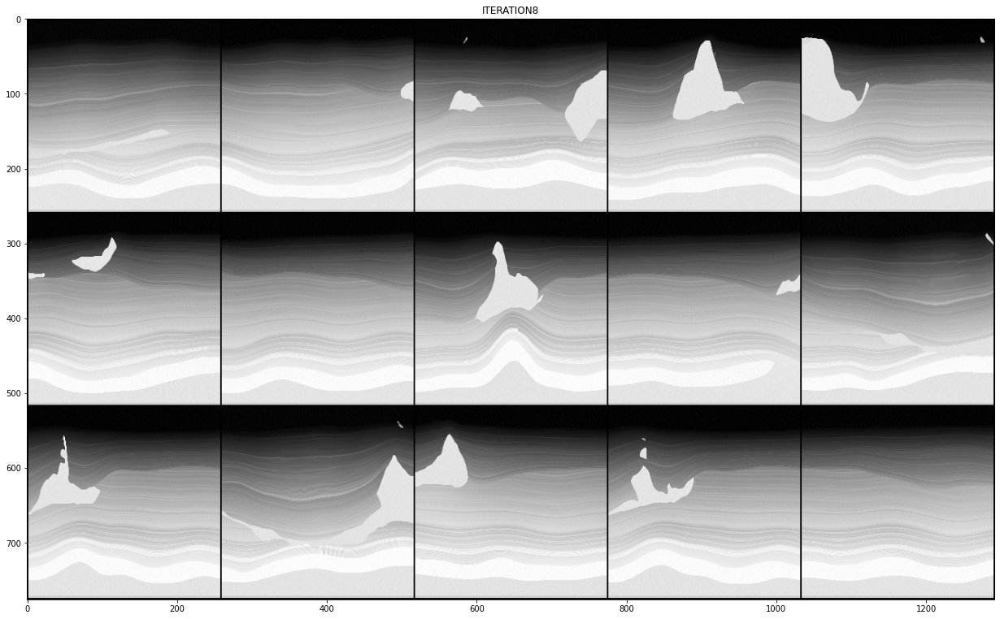

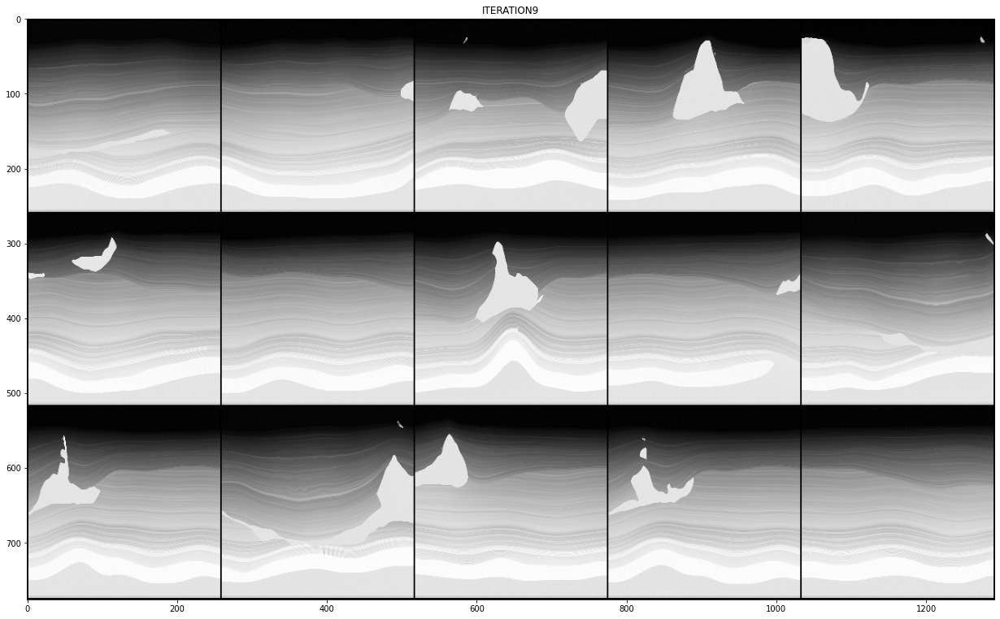

In [40]:
sample = x0.cpu()

sample = torch.clamp(sample, 0.0, 1.0)

grid_img = torchvision.utils.make_grid(sample, nrow=5)

dpi = matplotlib.rcParams['figure.dpi']

height = width = 6*256
figsize = width / float(dpi), height / float(dpi)

plt.figure(figsize=figsize)
plt.title("INITIALISATION")
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

for i in range(len(all_samples)//10):
    sample = all_samples[i*10].view(all_samples[i*10].shape[0], new_config.data.channels,
                                  new_config.data.image_size,
                                  new_config.data.image_size)

    sample = torch.clamp(sample, 0.0, 1.0)

    grid_img = torchvision.utils.make_grid(sample, nrow=5)

    dpi = matplotlib.rcParams['figure.dpi']

    height = width = 6*256
    figsize = width / float(dpi), height / float(dpi)

    plt.figure(figsize=figsize)
    plt.title("ITERATION" + str(i))
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.show()